In [1]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import altair as alt
import numpy as np
from scipy.stats import linregress


states = alt.topo_feature('https://vega.github.io/vega-datasets/data/us-10m.json', 'states')
counties= alt.topo_feature('https://vega.github.io/vega-datasets/data/us-10m.json', 'counties')

Connect and load data from DB.

In [2]:
conn=sqlite3.connect('data.db')
c=conn.cursor()
query = "SELECT name FROM sqlite_master WHERE type='table';"
c.execute(query)
tables=c.fetchall()
for table in tables:
  print(table[0])

five_hundred_cities
access
variable_list


In [3]:
def load_table_into_dataframe(table_name):

    query = f"SELECT * FROM {table_name};"

    df = pd.read_sql_query(query, conn,index_col=None)
    return df

In [4]:
cities_df=load_table_into_dataframe('five_hundred_cities')
access_df=load_table_into_dataframe('access')
variable_df=load_table_into_dataframe('variable_list')
conn.close()

In [5]:
print(f"DataFrame for 'five_hundred_cities' table:")
print(cities_df.head())
print(cities_df.columns)
print(cities_df.dtypes)
print(cities_df.describe())

DataFrame for 'five_hundred_cities' table:
   index StateAbbr   PlaceName  PlaceFIPS   TractFIPS        Place_TractID  \
0      0        AL  Birmingham     107000  1073000100  0107000-01073000100   
1      1        AL  Birmingham     107000  1073000300  0107000-01073000300   
2      2        AL  Birmingham     107000  1073000400  0107000-01073000400   
3      3        AL  Birmingham     107000  1073000500  0107000-01073000500   
4      4        AL  Birmingham     107000  1073000700  0107000-01073000700   

   Population2010  ACCESS2_CrudePrev ACCESS2_Crude95CI  ARTHRITIS_CrudePrev  \
0            3042               24.4      (21.2, 27.8)                 31.2   
1            2735               30.4      (27.1, 33.7)                 30.5   
2            3338               24.7      (21.1, 28.5)                 31.5   
3            2864               25.2      (21.6, 29.0)                 35.0   
4            2577               29.0      (24.5, 33.8)                 36.3   

   ... PAPTES

In [6]:
print(cities_df['Population2010'].sum())

103008981


Cities dataframe roughly covers 1/3 of Americas population.

In [7]:
print(f"DataFrame for 'access' table has {len(access_df)} rows:")
print(access_df.head())
print(access_df.columns)
print(access_df.dtypes)
print(access_df.describe())

DataFrame for 'access' table has 3143 rows:
   index  FIPS State   County  LACCESS_POP10  LACCESS_POP15  \
0      0  1001    AL  Autauga   18428.439685   17496.693038   
1      1  1003    AL  Baldwin   35210.814078   30561.264430   
2      2  1005    AL  Barbour    5722.305602    6069.523628   
3      3  1007    AL     Bibb    1044.867327     969.378841   
4      4  1009    AL   Blount    1548.175559    3724.428242   

   PCH_LACCESS_POP_10_15  PCT_LACCESS_POP10  PCT_LACCESS_POP15  \
0              -5.056026          33.769657          32.062255   
1             -13.204891          19.318473          16.767489   
2               6.067799          20.840972          22.105560   
3              -7.224696           4.559753           4.230324   
4             140.568857           2.700840           6.497380   

   LACCESS_LOWI10  ...  LACCESS_HISP15  PCT_LACCESS_HISP15  LACCESS_NHASIAN15  \
0     5344.427472  ...      471.136164            0.863345          86.767975   
1     9952.144027 

In [8]:
cities_df=cities_df[['index','StateAbbr', 'PlaceName', 'PlaceFIPS',
                    'TractFIPS','Place_TractID', 'Population2010',
                    'ACCESS2_CrudePrev', 'DIABETES_CrudePrev',
                    'OBESITY_CrudePrev', 'Geolocation']]

Select some interesting columns from the cities data based on reserach on some health conditions that qualifies people for food access programs.

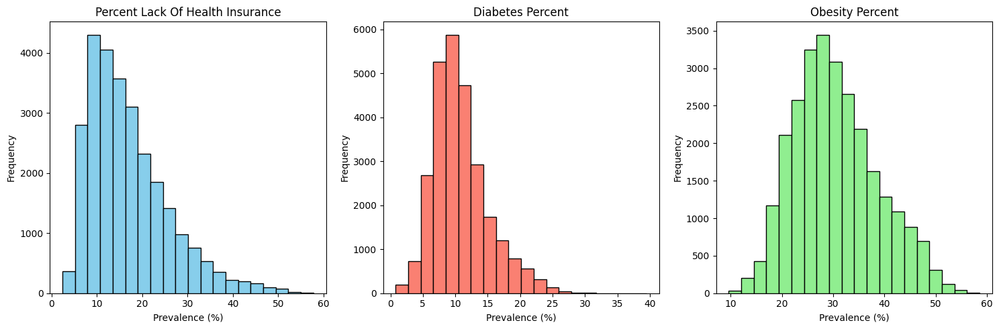

In [9]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].hist(cities_df['ACCESS2_CrudePrev'], bins=20, color='skyblue', edgecolor='black')
axes[0].set_title('Percent Lack Of Health Insurance')
axes[0].set_xlabel('Prevalence (%)')
axes[0].set_ylabel('Frequency')

axes[1].hist(cities_df['DIABETES_CrudePrev'], bins=20, color='salmon', edgecolor='black')
axes[1].set_title('Diabetes Percent')
axes[1].set_xlabel('Prevalence (%)')
axes[1].set_ylabel('Frequency')

axes[2].hist(cities_df['OBESITY_CrudePrev'], bins=20, color='lightgreen', edgecolor='black')
axes[2].set_title('Obesity Percent')
axes[2].set_xlabel('Prevalence (%)')
axes[2].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [10]:
cities_df[['Latitude','Longitude']]=cities_df['Geolocation'].str.extract(r'\(([^,]+),\s+([^)]+)\)').astype(float)
cities_df=cities_df.drop(labels='Geolocation',axis=1)
cities_df['FIPS']=cities_df['TractFIPS'].astype(str)
cities_df['FIPS']=cities_df['FIPS'].apply(lambda x:x.zfill(11)[:5])

Get latitide and longitude coords for visualization.

In [11]:
background = alt.Chart(states).mark_geoshape(
    fill='lightgray',
    stroke='white'
).project('albersUsa')

base = alt.Chart(cities_df).mark_circle(size=60).encode(
    longitude='Longitude:Q',
    latitude='Latitude:Q',
    color=alt.Color('OBESITY_CrudePrev:Q', scale=alt.Scale(scheme='viridis'),
    title='Prevalence (%)'),
    tooltip=['PlaceName:N', 'OBESITY_CrudePrev:Q']
).properties(
    width=600,
    height=400,
    title='Prevalence of Obesity Coverage by Location'
)

chart=background+base

chart.configure_title(
    fontSize=20,
    fontWeight='bold',
    color='black'
)

alt.data_transformers.enable('default', max_rows=None)
chart

alt.LayerChart(...)

In [12]:
state_avg = cities_df.groupby('StateAbbr').agg({
    'ACCESS2_CrudePrev':'mean',
    'Population2010':'sum'
}).reset_index()

bar_chart = alt.Chart(state_avg).mark_bar().encode(
    x=alt.X('StateAbbr:N', title='State', sort='-y'),
    y=alt.Y('ACCESS2_CrudePrev:Q', title='Average % Lack of Health Insurance'),
    color=alt.Color('ACCESS2_CrudePrev:Q', scale=alt.Scale(scheme='reds'),
    title='Average % Lack of Health Insurance'),
    tooltip=['StateAbbr:N', 'ACCESS2_CrudePrev:Q','Population2010']
).properties(
    width=600,
    height=400,
    title='Average Crude Prevalence of Lack of Health Insurance Coverage by State'
)

bar_chart.configure_title(
    fontSize=20,
    fontWeight='bold',
    color='black'
)
bar_chart

alt.Chart(...)

Southern US shows higher average percentage of obesity in their cities.

In [13]:
cities_df[['ACCESS2_CrudePrev', 'DIABETES_CrudePrev', 'OBESITY_CrudePrev']].corr()


,ACCESS2_CrudePrev,DIABETES_CrudePrev,OBESITY_CrudePrev
ACCESS2_CrudePrev,1.000000,0.568320,0.604421
DIABETES_CrudePrev,0.568320,1.000000,0.775815
OBESITY_CrudePrev,0.604421,0.775815,1.000000


Obesity shows a high correlation with diabetes and shows moderate correlation to % lack of health insurance.

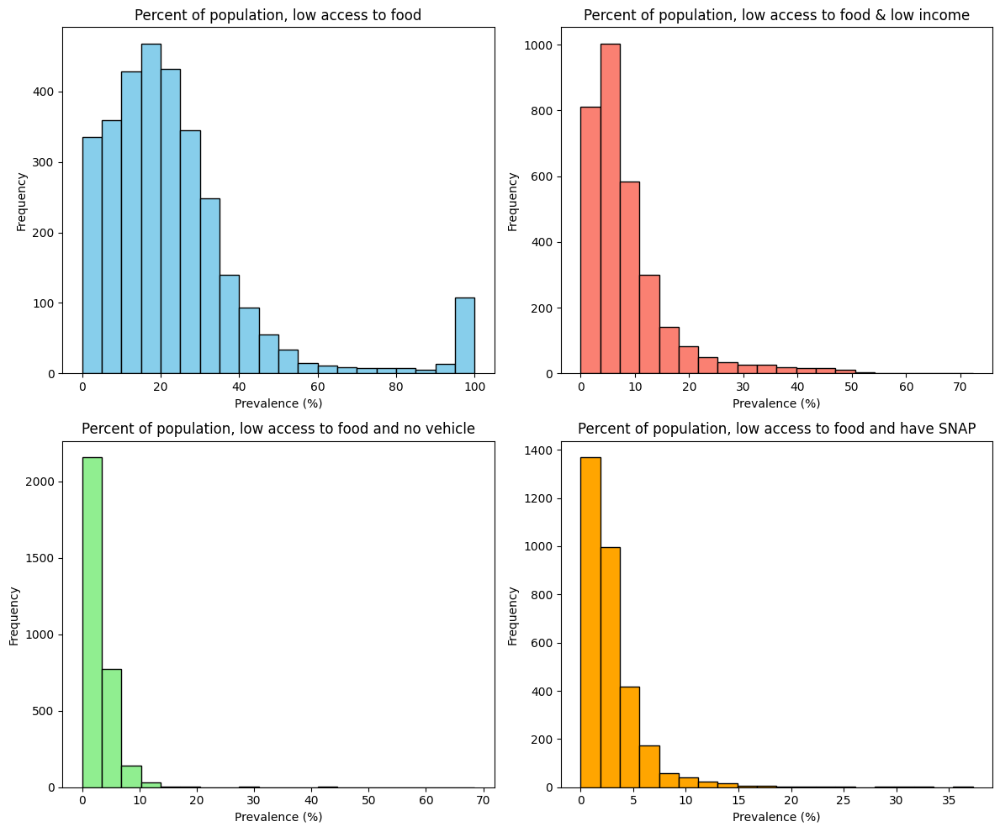

In [38]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0,0].hist(access_df['PCT_LACCESS_POP10'], bins=20, color='skyblue', edgecolor='black')
axes[0,0].set_title('Percent of population, low access to food')
axes[0,0].set_xlabel('Prevalence (%)')
axes[0,0].set_ylabel('Frequency')

axes[0,1].hist(access_df['PCT_LACCESS_LOWI10'], bins=20, color='salmon', edgecolor='black')
axes[0,1].set_title('Percent of population, low access to food & low income')
axes[0,1].set_xlabel('Prevalence (%)')
axes[0,1].set_ylabel('Frequency')

axes[1,0].hist(access_df['PCT_LACCESS_HHNV10'], bins=20, color='lightgreen', edgecolor='black')
axes[1,0].set_title('Percent of population, low access to food and no vehicle')
axes[1,0].set_xlabel('Prevalence (%)')
axes[1,0].set_ylabel('Frequency')

axes[1,1].hist(access_df['PCT_LACCESS_SNAP15'], bins=20, color='orange', edgecolor='black')
axes[1,1].set_title('Percent of population, low access to food and have SNAP')
axes[1,1].set_xlabel('Prevalence (%)')
axes[1,1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


Implications:
Urgent need to address the issue for those severely affected by limited food accessibility.

Policies or programs aimed at increasing income could potentially alleviate food accessibility issues.

Transportation doesn’t appear as significant as income in determining food access.

The effectiveness of SNAP suggests continued support and perhaps expansion to further alleviate these issues.

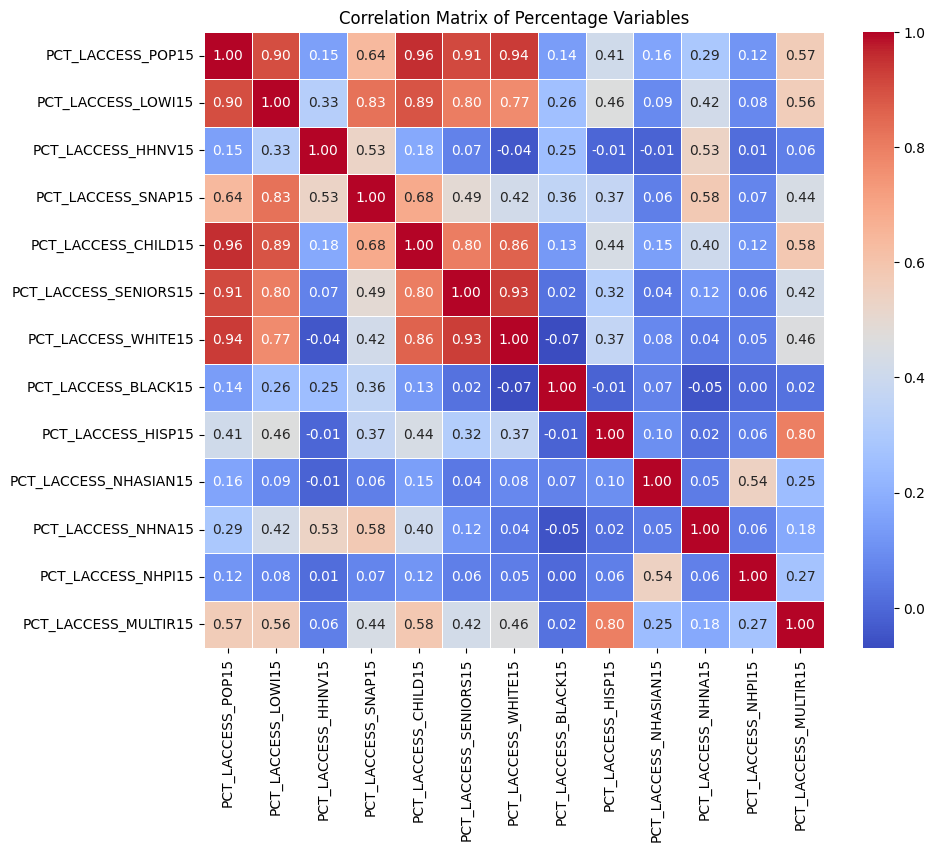

                       PCT_LACCESS_POP15  PCT_LACCESS_LOWI15  \
PCT_LACCESS_POP15               1.000000            0.902763   
PCT_LACCESS_LOWI15              0.902763            1.000000   
PCT_LACCESS_HHNV15              0.149968            0.325036   
PCT_LACCESS_SNAP15              0.636900            0.825737   
PCT_LACCESS_CHILD15             0.956234            0.890612   
PCT_LACCESS_SENIORS15           0.908680            0.801443   
PCT_LACCESS_WHITE15             0.936824            0.769996   
PCT_LACCESS_BLACK15             0.140744            0.256670   
PCT_LACCESS_HISP15              0.411640            0.464076   
PCT_LACCESS_NHASIAN15           0.161410            0.086723   
PCT_LACCESS_NHNA15              0.292461            0.416484   
PCT_LACCESS_NHPI15              0.115227            0.081516   
PCT_LACCESS_MULTIR15            0.566459            0.563567   

                       PCT_LACCESS_HHNV15  PCT_LACCESS_SNAP15  \
PCT_LACCESS_POP15                0.149

In [15]:
percent_variables_2015 = access_df[['PCT_LACCESS_POP15', 'PCT_LACCESS_LOWI15', 'PCT_LACCESS_HHNV15', 'PCT_LACCESS_SNAP15',
                                 'PCT_LACCESS_CHILD15', 'PCT_LACCESS_SENIORS15', 'PCT_LACCESS_WHITE15',
                                 'PCT_LACCESS_BLACK15', 'PCT_LACCESS_HISP15', 'PCT_LACCESS_NHASIAN15',
                                 'PCT_LACCESS_NHNA15', 'PCT_LACCESS_NHPI15', 'PCT_LACCESS_MULTIR15']]

percent_corr = percent_variables_2015.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(percent_corr, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Percentage Variables')
plt.show()

print(percent_corr)

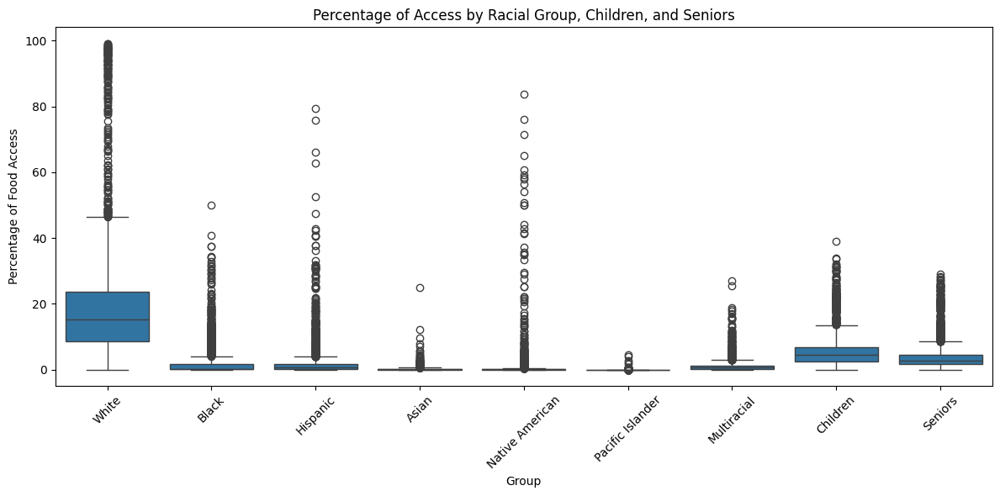

In [16]:
columns_of_interest = ['PCT_LACCESS_WHITE15', 'PCT_LACCESS_BLACK15', 'PCT_LACCESS_HISP15',
                       'PCT_LACCESS_NHASIAN15', 'PCT_LACCESS_NHNA15', 'PCT_LACCESS_NHPI15',
                       'PCT_LACCESS_MULTIR15', 'PCT_LACCESS_CHILD15', 'PCT_LACCESS_SENIORS15']

data_for_boxplot = access_df[columns_of_interest]

data_for_boxplot.columns = ['White', 'Black', 'Hispanic', 'Asian', 'Native American',
                            'Pacific Islander', 'Multiracial', 'Children', 'Seniors']

melted_data = data_for_boxplot.melt(var_name='Group', value_name='Percentage')


plt.figure(figsize=(12, 6))
sns.boxplot(x='Group', y='Percentage', data=melted_data)
plt.title('Percentage of Access by Racial Group, Children, and Seniors')
plt.xlabel('Group')
plt.ylabel('Percentage of Food Access')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Variability: The White group has the highest variability in access percentages, while the other groups have more consistent access percentages.

In [17]:
access_df = access_df[access_df['PCT_LACCESS_LOWI15'] < 100]
print("Shape of access_df after removing outliers:", access_df.shape)

Shape of access_df after removing outliers: (3123, 45)


In [18]:
choropleth_map = alt.Chart(counties).mark_geoshape().encode(
    color='PCT_LACCESS_POP10:Q',
    tooltip=['County:N','State:N','PCT_LACCESS_POP10:Q']
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(access_df, 'FIPS', ['PCT_LACCESS_POP10','County','State'])
).project(
    type='albersUsa'
).properties(
    width=800,
    height=500,
    title='% Low Access'
)


choropleth_map

alt.Chart(...)

In [19]:
state_avg = access_df.groupby('State').agg({
    'PCT_LACCESS_POP10':'mean',
    'LACCESS_POP10':'sum',
}).reset_index()

bar_chart = alt.Chart(state_avg).mark_bar().encode(
    x=alt.X('State:N', title='State', sort='-y'),
    y=alt.Y('PCT_LACCESS_POP10:Q', title='Average % Low Access'),
    color=alt.Color('PCT_LACCESS_POP10:Q', scale=alt.Scale(scheme='blues'),
    title='Average % Low Access by State'),
    tooltip=['State:N', 'PCT_LACCESS_POP10:Q','LACCESS_POP10']
).properties(
    width=600,
    height=400,
    title='Average % of Low Access in major cities in a State'
)

bar_chart.configure_title(
    fontSize=20,
    fontWeight='bold',
    color='black'
)
bar_chart

alt.Chart(...)

In [20]:
city_to_county=cities_df.groupby('FIPS').agg({
    'ACCESS2_CrudePrev':'mean',
    'Population2010':'sum',
    'DIABETES_CrudePrev':'mean', 'OBESITY_CrudePrev':'mean',
}).reset_index()
city_to_county['FIPS']=city_to_county['FIPS'].astype(int)
city_to_county.head()

,FIPS,ACCESS2_CrudePrev,Population2010,DIABETES_CrudePrev,OBESITY_CrudePrev
0,1073,18.469524,268987,14.712381,38.574286
1,1083,14.200000,1521,7.700000,31.700000
2,1089,16.173214,178484,12.391071,36.048214
3,1097,18.956000,195045,15.085333,38.829333
4,1101,19.718333,205733,14.761667,39.221667


In [21]:
percent_access10=access_df[['index', 'FIPS', 'State', 'County',
       'PCT_LACCESS_POP10', 'PCT_LACCESS_LOWI10',
       'PCT_LACCESS_HHNV10','PCT_LACCESS_CHILD10', 'PCT_LACCESS_SENIORS10',
        'PCT_LACCESS_SNAP15','PCT_LACCESS_WHITE15', 'PCT_LACCESS_BLACK15',
       'PCT_LACCESS_HISP15', 'PCT_LACCESS_NHASIAN15', 'PCT_LACCESS_NHNA15',
       'PCT_LACCESS_NHPI15', 'PCT_LACCESS_MULTIR15']]
print(percent_access10.columns)

Index(['index', 'FIPS', 'State', 'County', 'PCT_LACCESS_POP10',
       'PCT_LACCESS_LOWI10', 'PCT_LACCESS_HHNV10', 'PCT_LACCESS_CHILD10',
       'PCT_LACCESS_SENIORS10', 'PCT_LACCESS_SNAP15', 'PCT_LACCESS_WHITE15',
       'PCT_LACCESS_BLACK15', 'PCT_LACCESS_HISP15', 'PCT_LACCESS_NHASIAN15',
       'PCT_LACCESS_NHNA15', 'PCT_LACCESS_NHPI15', 'PCT_LACCESS_MULTIR15'],
      dtype='object')


In [22]:
merged_df = pd.merge(city_to_county,percent_access10, on='FIPS', how='inner')
merged_df.drop('index', inplace=True,axis=1)
merged_df.describe()

,FIPS,ACCESS2_CrudePrev,Population2010,DIABETES_CrudePrev,OBESITY_CrudePrev,PCT_LACCESS_POP10,PCT_LACCESS_LOWI10,PCT_LACCESS_HHNV10,PCT_LACCESS_CHILD10,PCT_LACCESS_SENIORS10,PCT_LACCESS_SNAP15,PCT_LACCESS_WHITE15,PCT_LACCESS_BLACK15,PCT_LACCESS_HISP15,PCT_LACCESS_NHASIAN15,PCT_LACCESS_NHNA15,PCT_LACCESS_NHPI15,PCT_LACCESS_MULTIR15
count,325.000000,325.000000,3.250000e+02,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000,325.000000
mean,29493.393846,16.382573,3.165200e+05,10.553969,32.265953,23.104990,6.589196,1.642477,5.816564,2.809519,2.459413,16.141044,3.041066,2.687618,0.684195,0.202517,0.033401,1.490814
std,16352.086092,5.754597,5.831366e+05,2.710032,5.463265,8.752759,3.826116,0.932376,2.333549,1.347503,1.646188,7.473168,4.063529,3.757001,0.692601,0.496987,0.131628,1.187815
min,1073.000000,7.350000,6.400000e+01,3.000000,16.530435,0.000126,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000126,0.000000,0.000000,0.000000
25%,13225.000000,12.302326,8.088500e+04,8.538462,28.570968,17.264687,3.949861,0.964334,4.235288,1.916963,1.315774,11.169042,0.512281,0.816794,0.290855,0.055391,0.006484,0.713802
50%,30063.000000,15.368182,1.374360e+05,10.362500,32.755134,23.688355,6.084094,1.480757,5.818578,2.646232,2.186046,15.637494,1.417242,1.527680,0.514292,0.093981,0.012075,1.152157
75%,45063.000000,19.240000,2.992130e+05,12.165000,35.869737,29.105293,8.448420,2.157995,7.258555,3.646458,3.337666,21.574710,3.952416,3.197342,0.857488,0.155283,0.025033,1.946741
max,56021.000000,44.533333,7.006911e+06,19.998000,48.712821,45.019068,26.551265,5.732457,14.941011,8.606595,11.019018,38.532252,28.778562,31.786765,7.839510,6.351811,2.243696,8.565204


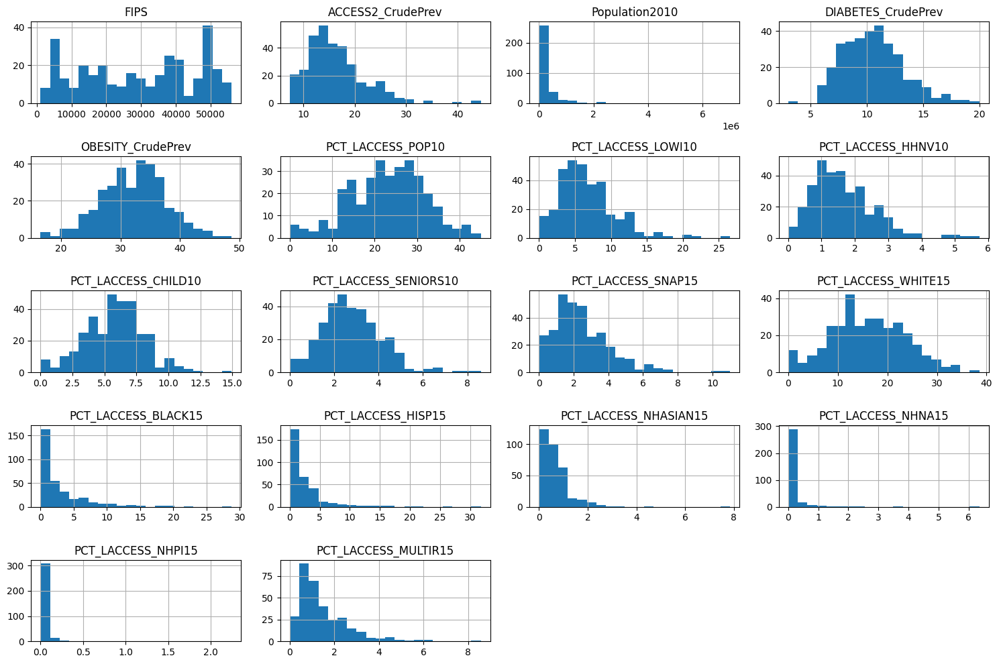

In [23]:
merged_df.hist(figsize=(15, 10),bins=20)
plt.tight_layout()
plt.show()

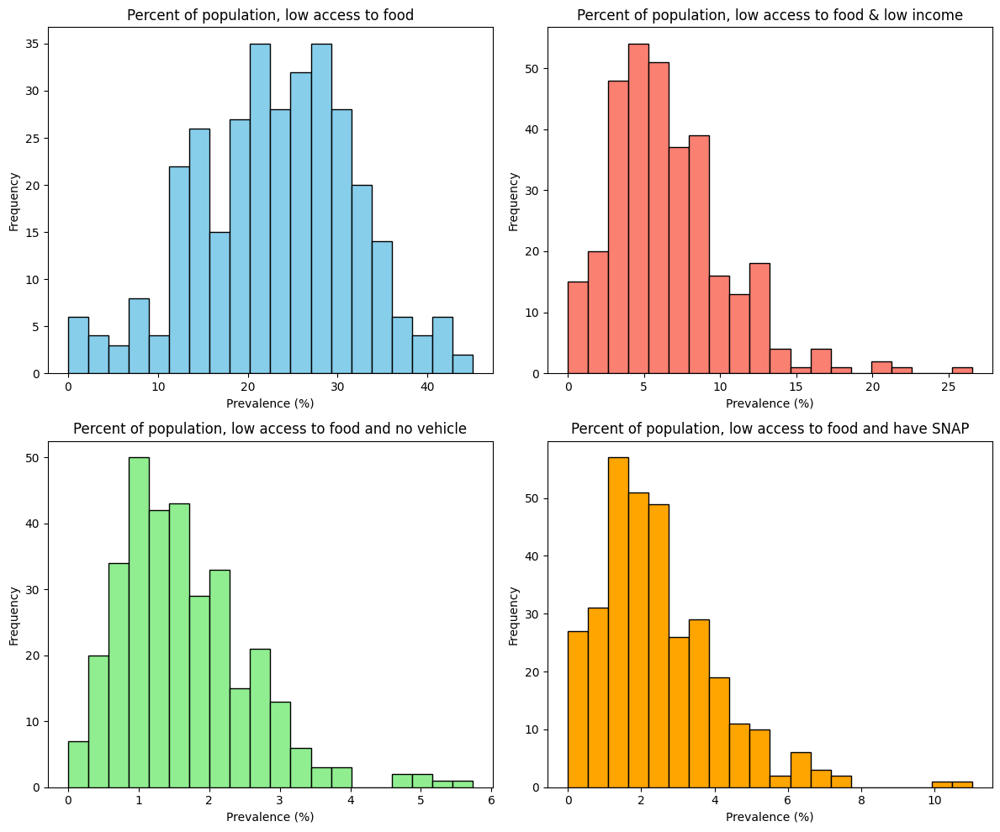

In [37]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

axes[0,0].hist(merged_df['PCT_LACCESS_POP10'], bins=20, color='skyblue', edgecolor='black')
axes[0,0].set_title('Percent of population, low access to food')
axes[0,0].set_xlabel('Prevalence (%)')
axes[0,0].set_ylabel('Frequency')

axes[0,1].hist(merged_df['PCT_LACCESS_LOWI10'], bins=20, color='salmon', edgecolor='black')
axes[0,1].set_title('Percent of population, low access to food & low income')
axes[0,1].set_xlabel('Prevalence (%)')
axes[0,1].set_ylabel('Frequency')

axes[1,0].hist(merged_df['PCT_LACCESS_HHNV10'], bins=20, color='lightgreen', edgecolor='black')
axes[1,0].set_title('Percent of population, low access to food and no vehicle')
axes[1,0].set_xlabel('Prevalence (%)')
axes[1,0].set_ylabel('Frequency')

axes[1,1].hist(merged_df['PCT_LACCESS_SNAP15'], bins=20, color='orange', edgecolor='black')
axes[1,1].set_title('Percent of population, low access to food and have SNAP')
axes[1,1].set_xlabel('Prevalence (%)')
axes[1,1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

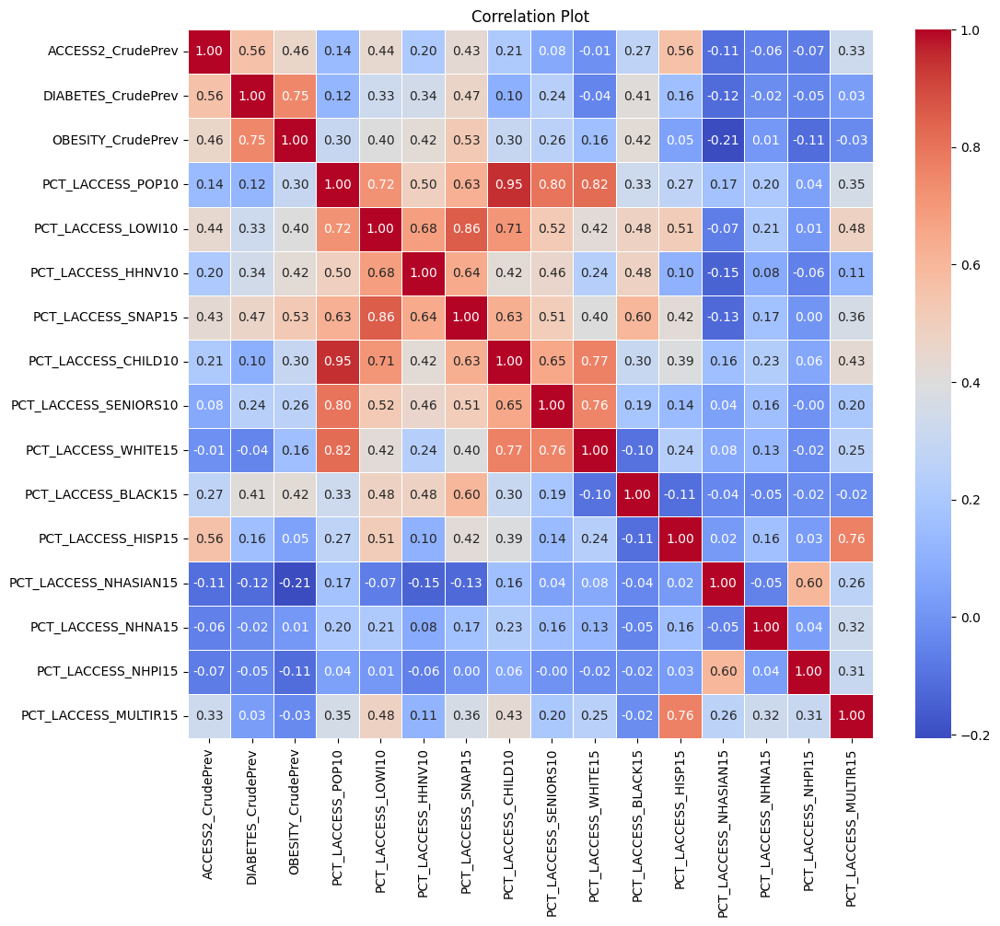

In [24]:
interest_cols=merged_df[['ACCESS2_CrudePrev','DIABETES_CrudePrev','OBESITY_CrudePrev','PCT_LACCESS_POP10', 'PCT_LACCESS_LOWI10',
       'PCT_LACCESS_HHNV10','PCT_LACCESS_SNAP15','PCT_LACCESS_CHILD10', 'PCT_LACCESS_SENIORS10',
        'PCT_LACCESS_WHITE15', 'PCT_LACCESS_BLACK15','PCT_LACCESS_HISP15', 'PCT_LACCESS_NHASIAN15', 'PCT_LACCESS_NHNA15',
       'PCT_LACCESS_NHPI15', 'PCT_LACCESS_MULTIR15']]
plt.figure(figsize=(12, 10))
sns.heatmap(interest_cols.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Plot')
plt.show()

In [25]:
print(interest_cols.corr())

                       ACCESS2_CrudePrev  DIABETES_CrudePrev  \
ACCESS2_CrudePrev               1.000000            0.558827   
DIABETES_CrudePrev              0.558827            1.000000   
OBESITY_CrudePrev               0.459119            0.749966   
PCT_LACCESS_POP10               0.139132            0.120509   
PCT_LACCESS_LOWI10              0.443083            0.326535   
PCT_LACCESS_HHNV10              0.204606            0.342150   
PCT_LACCESS_SNAP15              0.433816            0.465355   
PCT_LACCESS_CHILD10             0.208321            0.095616   
PCT_LACCESS_SENIORS10           0.075806            0.242046   
PCT_LACCESS_WHITE15            -0.009780           -0.043785   
PCT_LACCESS_BLACK15             0.269760            0.409736   
PCT_LACCESS_HISP15              0.559908            0.159255   
PCT_LACCESS_NHASIAN15          -0.112279           -0.117615   
PCT_LACCESS_NHNA15             -0.058278           -0.020519   
PCT_LACCESS_NHPI15             -0.071813

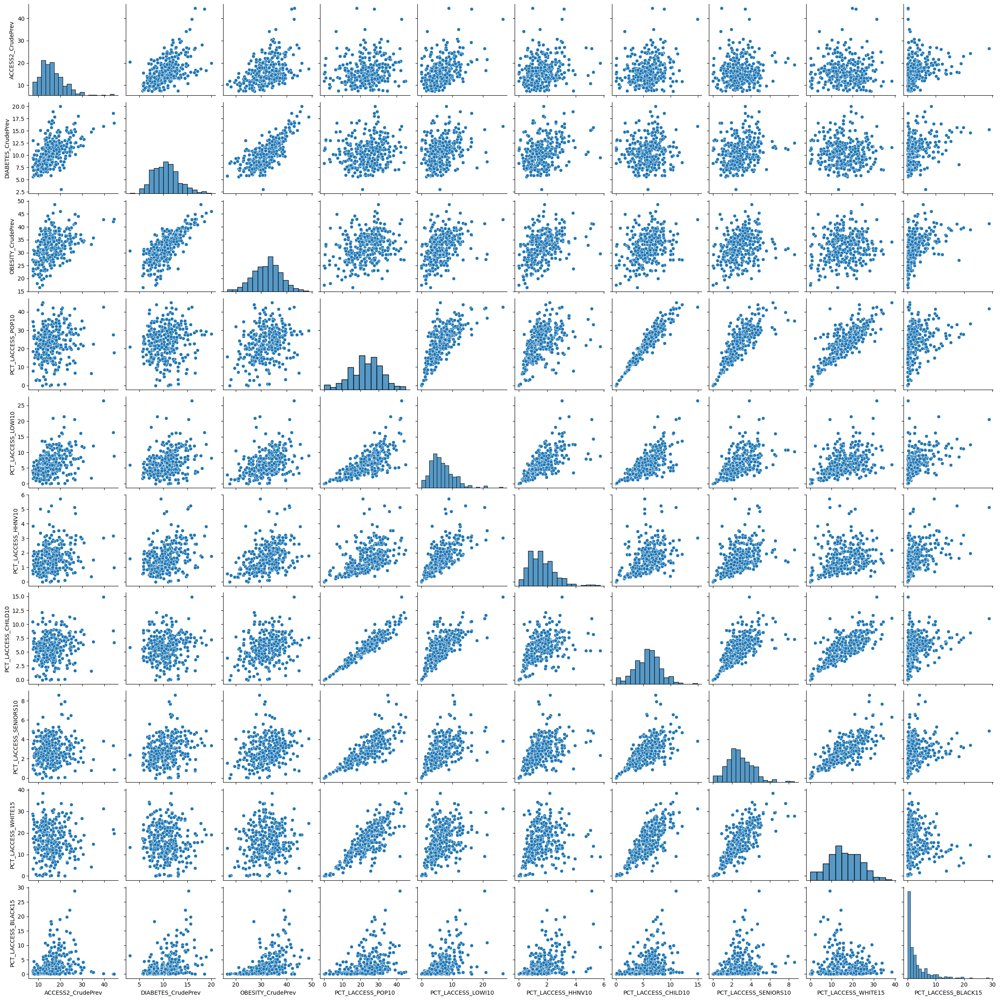

In [26]:
numeric_columns = ['ACCESS2_CrudePrev','DIABETES_CrudePrev','OBESITY_CrudePrev','PCT_LACCESS_POP10', 'PCT_LACCESS_LOWI10',
       'PCT_LACCESS_HHNV10','PCT_LACCESS_CHILD10', 'PCT_LACCESS_SENIORS10',
        'PCT_LACCESS_WHITE15', 'PCT_LACCESS_BLACK15']


sns.pairplot(merged_df[numeric_columns])
plt.show()

Using quartiles to categorize regions into three parts (low, medium, and high) based on both "ACCESS2_CrudePrev" (percentage of people lacking health insurance).
Use this to Assign scores to countys.


In [27]:
access_quartiles = merged_df['ACCESS2_CrudePrev'].quantile([0.25, 0.5, 0.75])


def categorize_access(value):
    if value <= access_quartiles[0.25]:
        return 1
    elif value <= access_quartiles[0.75]:
        return 2
    else:
        return 3

merged_df['Access_Score'] = merged_df['ACCESS2_CrudePrev'].apply(categorize_access)

laccess_quartiles = merged_df['PCT_LACCESS_LOWI10'].quantile([0.25, 0.5, 0.75])


def categorize_laccess(value):
    if value <= laccess_quartiles[0.25]:
        return 1
    elif value <= laccess_quartiles[0.75]:
        return 2
    else:
        return 3

merged_df['LowIncome_Access_Score'] = merged_df['PCT_LACCESS_LOWI10'].apply(categorize_laccess)


grid_categories = merged_df.groupby(['Access_Score', 'LowIncome_Access_Score']).size().unstack(fill_value=0)

print(grid_categories)

print(merged_df)

LowIncome_Access_Score   1   2   3
Access_Score                      
1                       37  41   4
2                       34  92  36
3                       11  29  41
      FIPS  ACCESS2_CrudePrev  Population2010  DIABETES_CrudePrev  \
0     1073          18.469524          268987           14.712381   
1     1083          14.200000            1521            7.700000   
2     1089          16.173214          178484           12.391071   
3     1097          18.956000          195045           15.085333   
4     1101          19.718333          205733           14.761667   
..     ...                ...             ...                 ...   
320  55087           9.675000           60022            7.910000   
321  55101          14.727273           78843            9.731818   
322  55133           9.690000           70717            7.045000   
323  55139          13.600000            1490            8.100000   
324  56021          16.318750           59466            8.537500 

In [28]:
merged_df['Combined_Score'] = merged_df['Access_Score'] + merged_df['LowIncome_Access_Score']


background = alt.Chart(states).mark_geoshape(
    fill='lightgray',
    stroke='white'
).project('albersUsa')
print(merged_df[['Access_Score', 'LowIncome_Access_Score', 'Combined_Score', 'County']])

     Access_Score  LowIncome_Access_Score  Combined_Score      County
0               2                       3               5   Jefferson
1               2                       1               3   Limestone
2               2                       2               4     Madison
3               2                       3               5      Mobile
4               3                       3               6  Montgomery
..            ...                     ...             ...         ...
320             1                       1               2   Outagamie
321             2                       2               4      Racine
322             1                       2               3    Waukesha
323             2                       2               4   Winnebago
324             2                       2               4     Laramie

[325 rows x 4 columns]


In [29]:

background = alt.Chart(states).mark_geoshape(
    fill='lightgray',
    stroke='white'
).project('albersUsa')
choropleth_map = alt.Chart(counties).mark_geoshape().encode(
    color='Combined_Score:Q',
    tooltip=['County:N','State:N','Combined_Score:Q']
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(merged_df, 'FIPS', ['Combined_Score','County','State'])
).project(
    type='albersUsa'
).properties(
    width=800,
    height=500,
    title='Counties to prioritze'
)
background+choropleth_map


alt.LayerChart(...)

Identitfy countys with High lack of insurance and large percent with low access/low income.  This will be prioritized.

In [30]:

print(merged_df[merged_df['Combined_Score'] == 6][['County','State', ]])

         County State
4    Montgomery    AL
10         Yuma    AZ
50       Pueblo    CO
58      Brevard    FL
63          Lee    FL
69         Polk    FL
70    St. Lucie    FL
71      Volusia    FL
74       Clarke    GA
76    Dougherty    GA
78      Houston    GA
80     Muscogee    GA
81        Peach    GA
82     Richmond    GA
117   Wyandotte    KS
150    Harrison    MS
151       Hinds    MS
193  Cumberland    NC
196     Forsyth    NC
197      Gaston    NC
201      Onslow    NC
217    Comanche    OK
218    Oklahoma    OK
254      Shelby    TN
255        Bell    TX
256       Bexar    TX
258      Brazos    TX
259     Cameron    TX
265     El Paso    TX
268       Gregg    TX
271     Hidalgo    TX
272   Jefferson    TX
275     Lubbock    TX
276    McLennan    TX
277     Midland    TX
279      Nueces    TX
280      Potter    TX
284      Taylor    TX
285   Tom Green    TX
287        Webb    TX
288     Wichita    TX


In [31]:
counties_score_6 = merged_df[merged_df['Combined_Score'] == 6]
counties_score_6['Estimated_People'] = counties_score_6[['ACCESS2_CrudePrev', 'PCT_LACCESS_LOWI10']].min(axis=1) * counties_score_6['Population2010']
total_estimated_population = counties_score_6['Estimated_People'].sum()

print("Total estimated population to be engaged in the food access program:", total_estimated_population)


Total estimated population to be engaged in the food access program: 103920537.54254179


<ipython-input-31-2695a4e88934>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  counties_score_6['Estimated_People'] = counties_score_6[['ACCESS2_CrudePrev', 'PCT_LACCESS_LOWI10']].min(axis=1) * counties_score_6['Population2010']


In [32]:
counties_score_6.iloc[:, 1:19].describe()

,ACCESS2_CrudePrev,Population2010,DIABETES_CrudePrev,OBESITY_CrudePrev,PCT_LACCESS_POP10,PCT_LACCESS_LOWI10,PCT_LACCESS_HHNV10,PCT_LACCESS_CHILD10,PCT_LACCESS_SENIORS10,PCT_LACCESS_SNAP15,PCT_LACCESS_WHITE15,PCT_LACCESS_BLACK15,PCT_LACCESS_HISP15,PCT_LACCESS_NHASIAN15,PCT_LACCESS_NHNA15,PCT_LACCESS_NHPI15
count,41.000000,4.100000e+01,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000,41.000000
mean,24.912566,2.051260e+05,12.534624,35.853411,31.227768,12.631561,2.481210,8.127506,3.754789,4.907204,19.557783,6.816318,7.068973,0.588049,0.210760,0.040363
std,6.139449,2.293909e+05,2.414845,4.000304,6.056510,3.786044,0.952861,1.826810,1.580989,1.892335,7.178342,6.599399,6.752250,0.394798,0.211526,0.059123
min,19.328571,3.640000e+02,6.937500,27.933333,17.897161,8.808377,0.987820,5.225958,0.873500,2.055803,6.111507,0.096487,0.323018,0.126822,0.043046,0.001994
25%,20.624138,9.686700e+04,11.203571,33.388235,27.993010,10.529690,1.815438,7.039220,2.899021,3.873301,13.053300,2.341442,2.218799,0.296886,0.106995,0.011072
50%,23.825806,1.278750e+05,12.341584,35.786260,30.668601,11.950310,2.577099,7.970349,3.395793,4.699084,20.271461,4.553738,4.620817,0.560944,0.143235,0.023138
75%,24.950000,2.005010e+05,14.544681,39.221667,35.002166,13.195825,3.032431,8.830192,4.236925,5.415416,24.498668,9.690152,9.988829,0.742397,0.221650,0.036804
max,44.533333,1.327135e+06,18.568750,43.085965,42.653448,26.551265,5.732457,14.941011,7.894336,11.019018,33.790447,28.778562,31.786765,2.111907,1.231484,0.309856


The mean values for health indicators such as DIABETES_CrudePrev and OBESITY_CrudePrev suggest that these counties may face moderate to high prevalence rates of diabetes and obesity.
The mean values for PCT_LACCESS_POP10 and PCT_LACCESS_LOWI10 indicate that, on average, a relatively large proportion of the population in these counties may have low access to healthy food options or may be living in low-income areas with limited food access.

<ipython-input-33-56110b911cf6>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(counties_score_6.iloc[:, 1:19].corr())
<ipython-input-33-56110b911cf6>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(counties_score_6.iloc[:, 1:19].corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)


                       ACCESS2_CrudePrev  Population2010  DIABETES_CrudePrev  \
ACCESS2_CrudePrev               1.000000        0.283761            0.675891   
Population2010                  0.283761        1.000000            0.274851   
DIABETES_CrudePrev              0.675891        0.274851            1.000000   
OBESITY_CrudePrev               0.549576        0.077946            0.807292   
PCT_LACCESS_POP10              -0.195838       -0.121739           -0.144514   
PCT_LACCESS_LOWI10              0.273794       -0.066581            0.107521   
PCT_LACCESS_HHNV10             -0.040851       -0.178795            0.021346   
PCT_LACCESS_CHILD10             0.214922        0.008264            0.168899   
PCT_LACCESS_SENIORS10          -0.256024       -0.194408           -0.014965   
PCT_LACCESS_SNAP15              0.368527       -0.042641            0.567615   
PCT_LACCESS_WHITE15             0.087912       -0.116551           -0.212749   
PCT_LACCESS_BLACK15            -0.311685

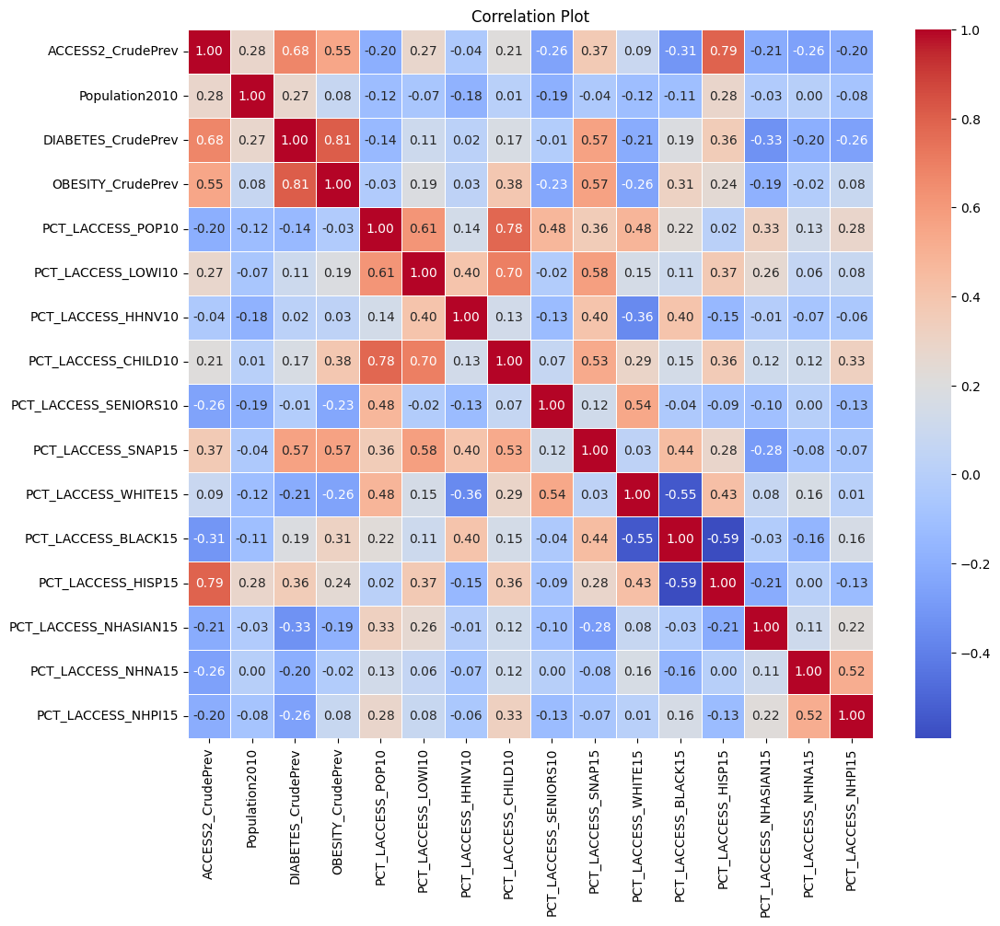

In [33]:
print(counties_score_6.iloc[:, 1:19].corr())
plt.figure(figsize=(12, 10))
sns.heatmap(counties_score_6.iloc[:, 1:19].corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Plot')
plt.show()


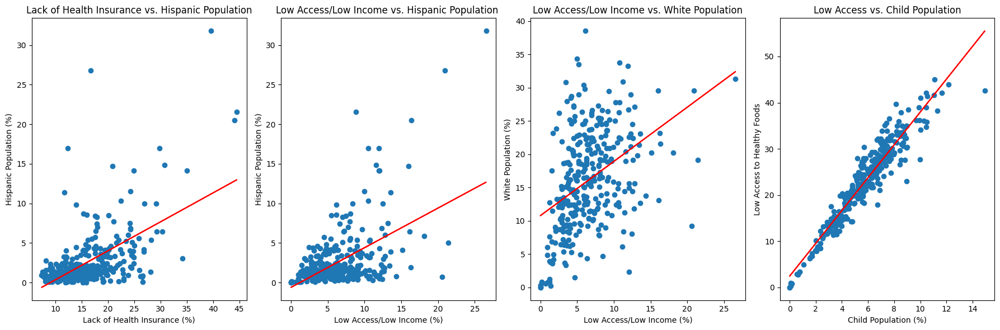

In [39]:
fig, axs = plt.subplots(1, 4, figsize=(18, 6))


def calculate_regression_line(x, y):
    slope, intercept, _, _, _ = linregress(x, y)
    return slope * x + intercept



axs[0].scatter(merged_df['ACCESS2_CrudePrev'],merged_df['PCT_LACCESS_HISP15'])
axs[0].set_ylabel('Hispanic Population (%)')
axs[0].set_xlabel('Lack of Health Insurance (%)')
axs[0].set_title('Lack of Health Insurance vs. Hispanic Population')
axs[0].plot(merged_df['ACCESS2_CrudePrev'], calculate_regression_line(merged_df['ACCESS2_CrudePrev'], merged_df['PCT_LACCESS_HISP15']), color='red')

axs[1].scatter( merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_HISP15'])
axs[1].set_ylabel('Hispanic Population (%)')
axs[1].set_xlabel('Low Access/Low Income (%)')
axs[1].set_title('Low Access/Low Income vs. Hispanic Population ')
axs[1].plot(merged_df['PCT_LACCESS_LOWI10'], calculate_regression_line(merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_HISP15']), color='red')

axs[2].scatter(merged_df['PCT_LACCESS_LOWI10'],merged_df['PCT_LACCESS_WHITE15'] )
axs[2].set_ylabel('White Population (%)')
axs[2].set_xlabel('Low Access/Low Income (%)')
axs[2].set_title('Low Access/Low Income vs. White Population')
axs[2].plot(merged_df['PCT_LACCESS_LOWI10'], calculate_regression_line(merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_WHITE15']), color='red')

axs[3].scatter(merged_df['PCT_LACCESS_CHILD10'], merged_df['PCT_LACCESS_POP10'])
axs[3].set_xlabel('Child Population (%)')
axs[3].set_ylabel('Low Access to Healthy Foods')
axs[3].set_title('Low Access vs. Child Population')
axs[3].plot(merged_df['PCT_LACCESS_CHILD10'], calculate_regression_line(merged_df['PCT_LACCESS_CHILD10'], merged_df['PCT_LACCESS_POP10']), color='red')


plt.tight_layout()


plt.show()

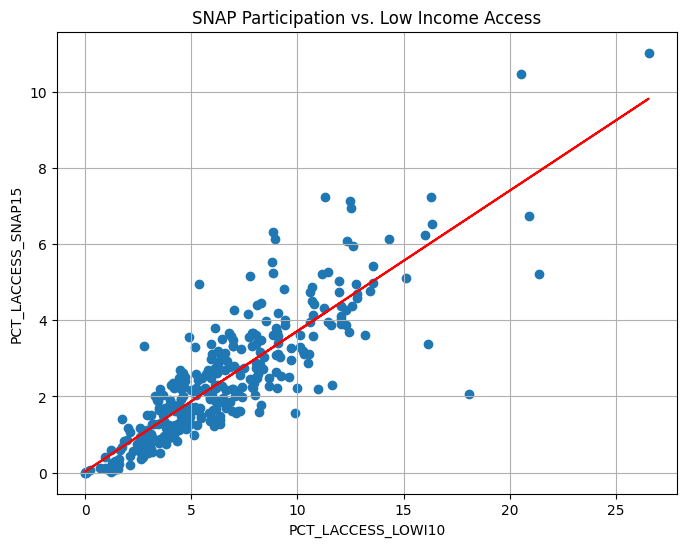

In [42]:
plt.figure(figsize=(8, 6))
plt.scatter(merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_SNAP15'])
plt.title('SNAP Participation vs. Low Income Access')
plt.xlabel('PCT_LACCESS_LOWI10')
plt.ylabel('PCT_LACCESS_SNAP15')
plt.plot(merged_df['PCT_LACCESS_LOWI10'], calculate_regression_line(merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_SNAP15']), color='red')
plt.grid(True)
plt.show()

This plot suggests that areas with higher participation in SNAP tend to have a higher percentage of residents with low income and low access to food. This implies that SNAP participation may effectively target and support low-income populations in accessing food.

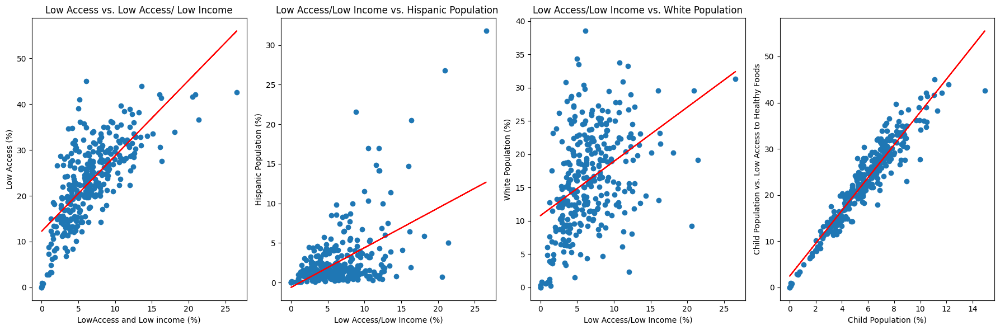

In [40]:
fig, axs = plt.subplots(1, 4, figsize=(18, 6))


def calculate_regression_line(x, y):
    slope, intercept, _, _, _ = linregress(x, y)
    return slope * x + intercept



axs[0].scatter(merged_df['PCT_LACCESS_LOWI10'],merged_df['PCT_LACCESS_POP10'])
axs[0].set_ylabel('Low Access (%)')
axs[0].set_xlabel('LowAccess and Low income (%)')
axs[0].set_title('Low Access vs. Low Access/ Low Income')
axs[0].plot(merged_df['PCT_LACCESS_LOWI10'], calculate_regression_line(merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_POP10']), color='red')

axs[0].scatter(merged_df['PCT_LACCESS_LOWI10'],merged_df['PCT_LACCESS_POP10'])
axs[0].set_ylabel('Low Access (%)')
axs[0].set_xlabel('LowAccess and Low income (%)')
axs[0].set_title('Low Access vs. Low Access/ Low Income')
axs[0].plot(merged_df['PCT_LACCESS_LOWI10'], calculate_regression_line(merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_POP10']), color='red')

axs[0].scatter(merged_df['PCT_LACCESS_LOWI10'],merged_df['PCT_LACCESS_POP10'])
axs[0].set_ylabel('Low Access (%)')
axs[0].set_xlabel('LowAccess and Low income (%)')
axs[0].set_title('Low Access vs. Low Access/ Low Income')
axs[0].plot(merged_df['PCT_LACCESS_LOWI10'], calculate_regression_line(merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_POP10']), color='red')

axs[0].scatter(merged_df['PCT_LACCESS_LOWI10'],merged_df['PCT_LACCESS_POP10'])
axs[0].set_ylabel('Low Access (%)')
axs[0].set_xlabel('LowAccess and Low income (%)')
axs[0].set_title('Low Access vs. Low Access/ Low Income')
axs[0].plot(merged_df['PCT_LACCESS_LOWI10'], calculate_regression_line(merged_df['PCT_LACCESS_LOWI10'], merged_df['PCT_LACCESS_POP10']), color='red')


plt.tight_layout()


plt.show()